In [1]:
# Dependencies and Setup
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import requests
import time
from scipy.stats import linregress
from datetime import datetime
from scipy import stats
import hvplot.pandas

import requests
import json

# Import the API key
from config import geoapify_key

# Skills List

In [2]:
# Read saved data: Skills Priority List from National Skills Commission - Australian Government 
Skills_List_db = pd.read_csv("Resources/Skills_Priority_List_2022.csv")

# Display sample data
Skills_List_db.head()

,ANZSCO Code,Occupation title,Current National Labour Market Rating,National Future Demand Rating,NSW,VIC,QLD,SA,WA,TAS,NT,ACT
0,111111,Chief Executive or Managing Director,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
1,111211,Corporate General Manager,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
2,121111,Aquaculture Farmer,NS,Moderate,NS,NS,S,NS,NS,NS,S,NS
3,121311,Apiarist,S,Moderate,S,S,S,S,NS,S,S,S
4,121312,Beef Cattle Farmer,NS,Soft,R,NS,S,NS,NS,NS,S,NS


## Current National Labour Market Rating

NS    628
S     278
R       8
Name: Current National Labour Market Rating, dtype: int64

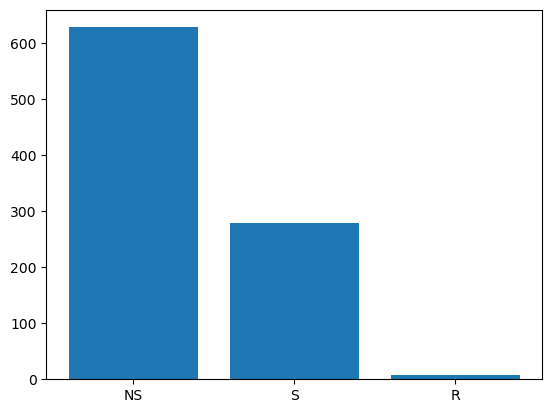

In [3]:
Shortage = Skills_List_db["Current National Labour Market Rating"].value_counts()

x_axis= Shortage.index

y_axis = Shortage.values

plt.bar(x_axis, y_axis, align="center")

Shortage

National Future Demand Rating

Moderate    572
Strong      234
Soft        108
Name: National Future Demand Rating, dtype: int64

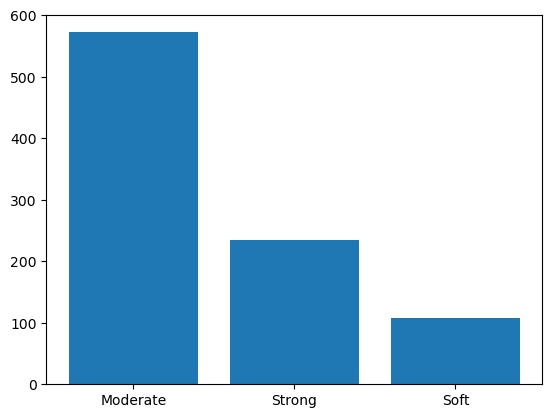

In [4]:
Future_Demand = Skills_List_db["National Future Demand Rating"].value_counts()

x_axis= Future_Demand.index

y_axis = Future_Demand.values

plt.bar(x_axis, y_axis, align="center")

Future_Demand

# Internet Vacancy Index Loading and Handling

In [5]:
# Read saved data (Internet Vacancy Index - https://www.jobsandskills.gov.au/work/internet-vacancy-index - IVI_DATA Detailed Occupation - March 2006 onwards)

IVI_Data_Det_Occupation = pd.read_csv("Resources/IVI_DATA_Detailed_Occupation - March 2006 onwards.csv")

# Display sample data
IVI_Data_Det_Occupation

,ANZSCO_CODE,ANZSCO_TITLE,state,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,...,Mar-22,Apr-22,May-22,Jun-22,Jul-22,Aug-22,Sep-22,Oct-22,Nov-22,Dec-22
0,0,Australia Total,AUST,214669,213341,222176,223386,233722,240445,240671,...,288689,286857,296332,288064,299587,305572,305676,307834,294213,259569
1,1111,Chief Executives and Managing Directors,AUST,159,161,181,207,214,213,197,...,431,430,433,442,473,475,471,487,487,418
2,1112,General Managers,AUST,309,308,320,311,308,301,294,...,681,678,696,700,724,763,759,756,697,663
3,1211,Aquaculture Farmers,AUST,1,1,1,1,1,1,2,...,0,0,0,0,0,0,1,1,0,0
4,1212,Crop Farmers,AUST,26,33,33,23,16,16,15,...,18,21,29,32,36,36,38,34,30,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,8994,Motor Vehicle Parts and Accessories Fitters,ACT,3,3,3,2,2,3,4,...,4,4,5,4,3,3,3,4,4,4
3164,8995,Printing Assistants and Table Workers,ACT,1,1,1,3,3,4,3,...,1,1,1,1,1,1,1,1,1,1
3165,8996,Recycling and Rubbish Collectors,ACT,0,0,0,0,0,1,1,...,0,1,1,0,0,0,0,0,0,0
3166,8997,Vending Machine Attendants,ACT,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
#Copy of the Skills List for data Handling
Skills_List_db2 = Skills_List_db.copy()

# Skills_List_db2["ANZSCO Code"].astype(str) 


In [8]:
#Total data for Internet Vacancy Index 

db= IVI_Data_Det_Occupation.groupby("state").sum()

db

,ANZSCO_CODE,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,Oct-06,Nov-06,...,Mar-22,Apr-22,May-22,Jun-22,Jul-22,Aug-22,Sep-22,Oct-22,Nov-22,Dec-22
state,,,,,,,,,,,,,,,,,,,,,
ACT,1491311,6419,6520,7140,7441,7969,8019,7979,8272,8173,...,16037,16307,16309,15412,15818,16151,16370,16762,16334,14591
AUST,1491311,428765,426116,443811,446234,466892,480298,480715,508214,498781,...,576429,572706,591503,574766,597666,609472,609778,614072,586928,517719
NSW,1491311,147803,148279,155443,156440,164702,167476,167181,172881,169243,...,185415,185490,191290,184816,190741,193316,193859,193755,184711,159935
NT,1491311,4862,4918,5415,5928,6305,6473,6126,6299,5998,...,5941,6048,6477,6307,6286,6224,6239,6304,6102,5476
QLD,1491311,98307,95690,99447,100819,103043,107299,107520,119160,118201,...,111285,110647,116210,115243,121323,125015,126215,128563,124080,108867
SA,1491311,26642,26197,26960,26413,27763,28991,29234,30326,28956,...,28696,28657,29601,28999,30962,32302,32847,32567,30774,26848
TAS,1491311,6441,6013,5839,5295,5343,5698,5568,6277,6261,...,6793,6622,7221,7436,8246,8663,8593,8341,7650,6839
VIC,1491311,100976,101003,103995,103120,108451,111919,112898,118769,115531,...,157728,156899,160363,153568,157509,158837,157107,159077,152630,137086
WA,1491311,37239,37464,39521,40745,43285,44368,44160,46189,46368,...,64497,62037,64029,62950,66773,68970,68513,68703,64622,58102


In [9]:
# Copying IVI Database for Handling

db2 = db.copy()

#Removing "ANZCO_CODE" Column and AUST Row for Further visualization handling

db2 = db2.drop(columns=["ANZSCO_CODE"])

db2 = db2.drop("AUST")

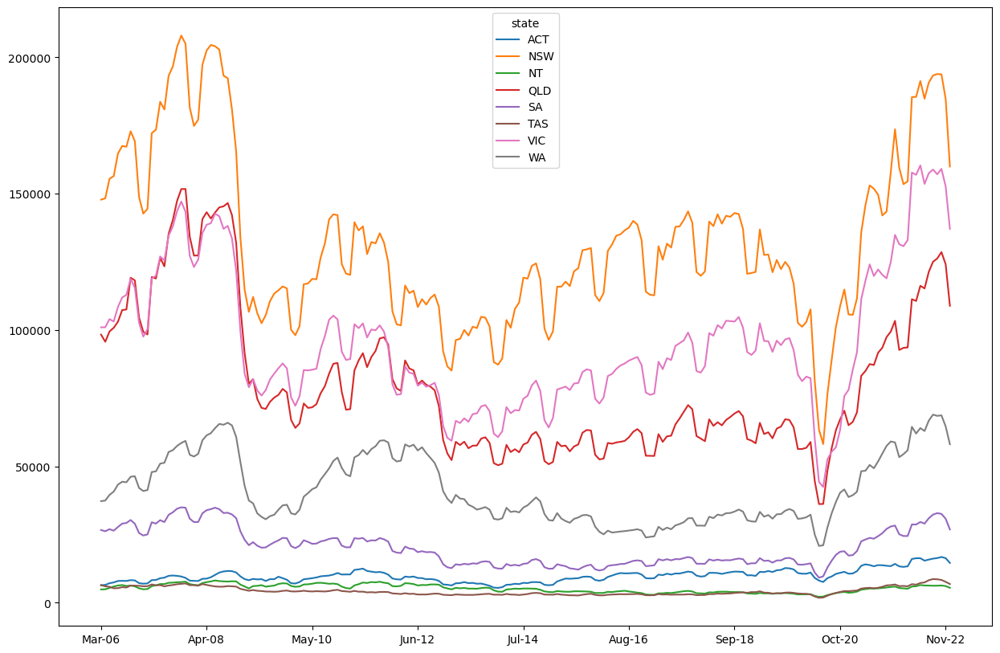

In [11]:
summary = db2

#Transposing for visualization 

summary = summary.T

summary.plot(figsize=(15,10));

# Loading ANZSCO Australian and New Zealand Standard Classification of Occupations Information

Data loaded underwent a reformating process prior to loading

https://www.abs.gov.au/AUSSTATS/abs@.nsf/DetailsPage/1220.02013,%20Version%201.3?OpenDocument Data 


In [12]:
# Read saved data ANZCO_Major_Groups Information
ANZCO_Major_Groups = pd.read_csv("Resources/ANZSCO_Major_Groups.csv")

# Display sample data
ANZCO_Major_Groups

,Major Group,Major Group Description,Predominant Skill Levels,Unnamed: 3,Unnamed: 4
0,1,Managers,"1, 2",NaN,NaN
1,2,Professionals,1,NaN,NaN
2,3,Technicians and Trades Workers,"2, 3",NaN,NaN
3,4,Community and Personal Service Workers,"2, 3, 4, 5",NaN,NaN
4,5,Clerical and Administrative Workers,"2, 3, 4, 5",NaN,NaN
5,6,Sales Workers,"3, 4, 5",NaN,NaN
6,7,Machinery Operators and Drivers,"3,4",NaN,NaN
7,8,Labourers,"4, 5",NaN,NaN


In [13]:
# Read saved data ANZCO_Sub_Major_Groups
ANZCO_Sub_Major_Groups = pd.read_csv("Resources/ANZSCO_Sub_Major_Groups.csv")

# Display sample data
ANZCO_Sub_Major_Groups

,Major Group,Sub-Major Group,Sub-Major Group Description,Predominant Skill Level(s),Unnamed: 4,Unnamed: 5
0,1,11,"Chief Executives, General Managers and Legisla...",1,NaN,NaN
1,1,12,Farmers and Farm Managers,1,NaN,NaN
2,1,13,Specialist Managers,1,NaN,NaN
3,1,14,"Hospitality, Retail and Service Managers",2,NaN,NaN
4,2,21,Arts and Media Professionals,"1,2",NaN,NaN
5,2,22,"Business, Human Resource and Marketing Profess...",1,NaN,NaN
6,2,23,"Design, Engineering, Science and Transport Pro...","1,2",NaN,NaN
7,2,24,Education Professionals,1,NaN,NaN
8,2,25,Health Professionals,1,NaN,NaN
9,2,26,ICT Professionals,1,NaN,NaN


In [14]:
# Read saved data ANZCO_Minor_Groups
ANZCO_Minor_Groups = pd.read_csv("Resources/ANZSCO_Minor_Groups.csv")

# Display sample data
ANZCO_Minor_Groups

,Major Group,Sub-Major Group,Minor Group,Minor Group Description,Predominant Skill Level(s),Unnamed: 5,Unnamed: 6
0,1,11,111,"Chief Executives, General Managers and Legisla...",1,NaN,NaN
1,1,12,121,Farmers and Farm Managers,1,NaN,NaN
2,1,13,131,"Advertising, Public Relations and Sales Managers",1,NaN,NaN
3,1,13,132,Business Administration Managers,1,NaN,NaN
4,1,13,133,"Construction, Distribution and Production Mana...",1,NaN,NaN
...,...,...,...,...,...,...,...
91,8,83,839,Miscellaneous Factory Process Workers,"4,5",NaN,NaN
92,8,84,841,"Farm, Forestry and Garden Workers",5,NaN,NaN
93,8,85,851,Food Preparation Assistants,5,NaN,NaN
94,8,89,891,Freight Handlers and Shelf Fillers,5,NaN,NaN


In [15]:
# Read saved data ANZCO_Unit_Groups
ANZCO_Unit_Groups = pd.read_csv("Resources/ANZSCO_Unit_Groups.csv")

# Display sample data
ANZCO_Unit_Groups

,Major Group,Sub-Major Group,Minor Group,Unit Group,Unit Group Description,Skill Level(s),Unnamed: 6
0,1,11,111,1111,Chief Executives and Managing Directors,1,NaN
1,1,11,111,1112,General Managers,1,NaN
2,1,11,111,1113,Legislators,1,NaN
3,1,12,121,1211,Aquaculture Farmers,1,NaN
4,1,12,121,1212,Crop Farmers,1,NaN
...,...,...,...,...,...,...,...
353,8,89,899,8994,Motor Vehicle Parts and Accessories Fitters,4,NaN
354,8,89,899,8995,Printing Assistants and Table Workers,4,NaN
355,8,89,899,8996,Recycling and Rubbish Collectors,5,NaN
356,8,89,899,8997,Vending Machine Attendants,5,NaN


In [16]:
# Read saved data ANZCO_Unit_Occupation_Groups
ANZCO_Unit_Occupation_Groups = pd.read_csv("Resources/ANZSCO_Unit_Occupation_Groups.csv")

# Display sample data
ANZCO_Unit_Occupation_Groups

,Major Group,Sub-Major Group,Minor Group,Unit Group,Occupation,Occupation Description,Skill Level,Unnamed: 7
0,1,11,111,1111,111111,Chief Executive or Managing Director,1,NaN
1,1,11,111,1112,111211,Corporate General Manager,1,NaN
2,1,11,111,1112,111212,Defence Force Senior Officer,1,NaN
3,1,11,111,1113,111311,Local Government Legislator,1,NaN
4,1,11,111,1113,111312,Member of Parliament,1,NaN
...,...,...,...,...,...,...,...,...
1027,8,89,899,8999,899918,Sign Erector,5,NaN
1028,8,89,899,8999,899921,Ticket Collector or Usher,5,NaN
1029,8,89,899,8999,899922,Trolley Collector,5,NaN
1030,8,89,899,8999,899923,Road Traffic Controller,5,NaN


In [17]:
# Read saved data ANZCO_Valid_Codes
ANZCO_Valid_Codes = pd.read_csv("Resources/ANZSCO_Valid_Codes.csv")

# Display sample data
ANZCO_Valid_Codes

,Code,Title
0,100000,Managers nfd
1,111000,"Chief Executives, General Managers and Legisla..."
2,111111,Chief Executive or Managing Director
3,111200,General Managers nfd
4,111211,Corporate General Manager
...,...,...
1347,899918,Sign Erector
1348,899921,Ticket Collector or Usher
1349,899922,Trolley Collector
1350,899923,Road Traffic Controller


## Creating ties with common information between data bases

In [18]:
# Creating dataframe copies for handling

Skills_List_db_work = Skills_List_db.copy()
IVI_Data_Det_work = IVI_Data_Det_Occupation.copy()
ANZCO_Unit_Occupation_gr_work = ANZCO_Unit_Occupation_Groups.copy()

In [19]:
# Renaming columns to be able to merge 

IVI_Data_Det_work = IVI_Data_Det_work.rename (columns={"ANZSCO_CODE":"Unit Group"})
ANZCO_Unit_Occupation_gr_work = ANZCO_Unit_Occupation_gr_work.rename (columns={"Occupation":"ANZSCO Code"})

In [20]:
# Merge two dataframes using an inner join
mergedx_df = pd.merge(IVI_Data_Det_work, ANZCO_Unit_Occupation_gr_work, on="Unit Group")
mergedx_df

,Unit Group,ANZSCO_TITLE,state,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,...,Oct-22,Nov-22,Dec-22,Major Group,Sub-Major Group,Minor Group,ANZSCO Code,Occupation Description,Skill Level,Unnamed: 7
0,1111,Chief Executives and Managing Directors,AUST,159,161,181,207,214,213,197,...,487,487,418,1,11,111,111111,Chief Executive or Managing Director,1,NaN
1,1111,Chief Executives and Managing Directors,NSW,57,57,59,67,75,83,76,...,146,148,115,1,11,111,111111,Chief Executive or Managing Director,1,NaN
2,1111,Chief Executives and Managing Directors,VIC,33,31,32,38,36,37,34,...,129,127,118,1,11,111,111111,Chief Executive or Managing Director,1,NaN
3,1111,Chief Executives and Managing Directors,QLD,39,40,46,49,45,37,32,...,83,88,72,1,11,111,111111,Chief Executive or Managing Director,1,NaN
4,1111,Chief Executives and Managing Directors,SA,13,14,16,20,21,19,20,...,31,27,22,1,11,111,111111,Chief Executive or Managing Director,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9076,8999,Other Miscellaneous Labourers,ACT,75,77,76,61,63,66,89,...,90,73,61,8,89,899,899918,Sign Erector,5,NaN
9077,8999,Other Miscellaneous Labourers,ACT,75,77,76,61,63,66,89,...,90,73,61,8,89,899,899921,Ticket Collector or Usher,5,NaN
9078,8999,Other Miscellaneous Labourers,ACT,75,77,76,61,63,66,89,...,90,73,61,8,89,899,899922,Trolley Collector,5,NaN
9079,8999,Other Miscellaneous Labourers,ACT,75,77,76,61,63,66,89,...,90,73,61,8,89,899,899923,Road Traffic Controller,5,NaN


In [21]:
# Merge two dataframes using an inner join
mergedx2_df = pd.merge(mergedx_df, Skills_List_db_work, on="ANZSCO Code")
mergedx2_df

,Unit Group,ANZSCO_TITLE,state,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,...,Current National Labour Market Rating,National Future Demand Rating,NSW,VIC,QLD,SA,WA,TAS,NT,ACT
0,1111,Chief Executives and Managing Directors,AUST,159,161,181,207,214,213,197,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
1,1111,Chief Executives and Managing Directors,NSW,57,57,59,67,75,83,76,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
2,1111,Chief Executives and Managing Directors,VIC,33,31,32,38,36,37,34,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
3,1111,Chief Executives and Managing Directors,QLD,39,40,46,49,45,37,32,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
4,1111,Chief Executives and Managing Directors,SA,13,14,16,20,21,19,20,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7456,8995,Printing Assistants and Table Workers,SA,24,24,22,20,18,16,22,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
7457,8995,Printing Assistants and Table Workers,WA,10,13,15,11,11,12,12,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
7458,8995,Printing Assistants and Table Workers,TAS,2,2,2,2,2,3,3,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
7459,8995,Printing Assistants and Table Workers,NT,1,1,1,1,1,1,1,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS


In [22]:
# Removing unnecesary data

mergedx3_df= mergedx2_df.loc[(mergedx2_df.state != "AUST"),:]
mergedx3_df= mergedx3_df.drop(columns=["Major Group","Sub-Major Group","Minor Group","Occupation Description", "Skill Level", "Unnamed: 7"])
mergedx3_df

,Unit Group,ANZSCO_TITLE,state,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,...,Current National Labour Market Rating,National Future Demand Rating,NSW,VIC,QLD,SA,WA,TAS,NT,ACT
1,1111,Chief Executives and Managing Directors,NSW,57,57,59,67,75,83,76,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
2,1111,Chief Executives and Managing Directors,VIC,33,31,32,38,36,37,34,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
3,1111,Chief Executives and Managing Directors,QLD,39,40,46,49,45,37,32,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
4,1111,Chief Executives and Managing Directors,SA,13,14,16,20,21,19,20,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
5,1111,Chief Executives and Managing Directors,WA,6,8,11,14,14,14,11,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7456,8995,Printing Assistants and Table Workers,SA,24,24,22,20,18,16,22,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
7457,8995,Printing Assistants and Table Workers,WA,10,13,15,11,11,12,12,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
7458,8995,Printing Assistants and Table Workers,TAS,2,2,2,2,2,3,3,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
7459,8995,Printing Assistants and Table Workers,NT,1,1,1,1,1,1,1,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS


In [23]:
# Sorting by last Internet Vacancy Index (December -2022)

mergedx3_df = mergedx3_df.sort_values("Dec-22", ascending=False)
mergedx3_df

,Unit Group,ANZSCO_TITLE,state,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,...,Current National Labour Market Rating,National Future Demand Rating,NSW,VIC,QLD,SA,WA,TAS,NT,ACT
5851,5311,General Clerks,NSW,3939,3835,4008,4077,4453,4639,4620,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
5852,5311,General Clerks,VIC,2485,2487,2614,2600,2725,2753,2712,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
5853,5311,General Clerks,QLD,2523,2469,2601,2545,2645,2749,2922,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS
2990,2544,Registered Nurses,VIC,606,580,599,608,671,695,707,...,S,Strong,S,S,S,S,S,S,S,S
3017,2544,Registered Nurses,VIC,606,580,599,608,671,695,707,...,S,Strong,S,S,S,S,S,S,S,S
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,2112,Music Professionals,NT,0,1,1,1,1,2,2,...,NS,Strong,NS,NS,NS,NS,NS,NS,NS,NS
789,2112,Music Professionals,TAS,1,1,1,0,0,0,0,...,NS,Strong,NS,NS,NS,NS,NS,NS,NS,NS
790,2112,Music Professionals,NT,0,1,1,1,1,2,2,...,NS,Strong,NS,NS,NS,NS,NS,NS,NS,NS
798,2113,Photographers,TAS,1,1,1,0,1,1,1,...,NS,Moderate,NS,NS,NS,NS,NS,NS,NS,NS


## Creating 2 Different dataframes : 

1. Australia Total has the current status

2. Australia High Demand has been filtered by occupations currently on shortage and strong Future Demand

In [24]:
Australia_total_Occupations = mergedx3_df.groupby("ANZSCO_TITLE").sum()

Australia_total_Occupations = Australia_total_Occupations.sort_values("Dec-22", ascending=False)

Australia_High_Demand = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong"),:]

Australia_High_Demand = Australia_High_Demand.groupby("ANZSCO_TITLE").sum()

Australia_High_Demand = Australia_High_Demand.sort_values("Dec-22", ascending=False)

In [25]:
# Selecting top 10 occupations from the 2 dataframes

Australia_top = Australia_total_Occupations.head(10)

Australia_top


,Unit Group,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,Oct-06,Nov-06,...,Apr-22,May-22,Jun-22,Jul-22,Aug-22,Sep-22,Oct-22,Nov-22,Dec-22,ANZSCO Code
ANZSCO_TITLE,,,,,,,,,,,,,,,,,,,,,
Registered Nurses,284928,28448,27972,28798,28798,30772,31906,32130,33068,32032,...,107352,113820,116088,125286,129738,128254,128576,124516,117278,28495440
Software and Applications Programmers,104520,26785,28260,31415,32850,34615,34250,33600,34230,33640,...,42725,41475,37800,39245,39210,38745,37810,35875,31335,10453192
Retail Managers,68208,14106,13896,14580,14904,15486,15780,15828,16902,16908,...,24036,24150,23364,24546,25464,25122,25794,24792,22656,6821448
Metal Fitters and Machinists,155136,10488,10152,10230,10128,10344,10422,9978,10278,9960,...,19518,20142,19728,20778,21396,21378,21306,20514,18816,15514912
Child Carers,134752,6628,6528,6632,6308,6128,6284,6252,6620,6204,...,16428,17552,17124,17952,18196,18412,18884,18400,17108,13475600
Motor Mechanics,102784,7328,6996,7032,6996,7176,7228,7008,7336,7080,...,16416,16380,16108,16860,17260,17360,17416,17116,15692,10278800
Truck Drivers,293240,14445,13970,13995,13295,13420,13765,14475,16930,17730,...,16065,16050,15540,16080,16830,17030,17420,16735,14605,29324520
Advertising and Sales Managers,31464,19188,19251,19947,20331,21495,21594,20802,20688,20241,...,17346,17787,17124,17541,17739,17631,17643,16446,14388,3146712
Civil Engineering Professionals,93280,10680,11455,12410,15050,15685,15980,13820,14915,15170,...,13800,14525,14530,15720,16345,16070,15995,15205,14355,9328520


In [26]:
Aus_High_Demand_Top = Australia_High_Demand.head(10)
Aus_High_Demand_Top 

,Unit Group,Mar-06,Apr-06,May-06,Jun-06,Jul-06,Aug-06,Sep-06,Oct-06,Nov-06,...,Apr-22,May-22,Jun-22,Jul-22,Aug-22,Sep-22,Oct-22,Nov-22,Dec-22,ANZSCO Code
ANZSCO_TITLE,,,,,,,,,,,,,,,,,,,,,
Registered Nurses,284928,28448,27972,28798,28798,30772,31906,32130,33068,32032,...,107352,113820,116088,125286,129738,128254,128576,124516,117278,28495440
Software and Applications Programmers,104520,26785,28260,31415,32850,34615,34250,33600,34230,33640,...,42725,41475,37800,39245,39210,38745,37810,35875,31335,10453192
Electricians,54576,3408,3224,3254,3256,3340,3378,3232,3422,3260,...,6314,6424,6322,6666,6794,6726,6666,6360,5680,5457784
"Contract, Program and Project Administrators",81776,2646,2786,3068,3486,3710,3768,3440,3578,3612,...,5252,5520,5362,5640,5686,5634,5602,5352,4784,8177784
Aged and Disabled Carers,33848,984,957,995,984,1031,1060,1086,1108,1080,...,4162,4575,4702,5012,5101,5179,5283,5162,4642,3384888
Child Carers,33688,1657,1632,1658,1577,1532,1571,1563,1655,1551,...,4107,4388,4281,4488,4549,4603,4721,4600,4277,3368888
ICT Business and Systems Analysts,20888,3124,3232,3467,3513,3675,3730,3806,3908,3940,...,4068,4089,3788,3904,3831,3737,3650,3481,3052,2088896
Civil Engineering Professionals,18656,2136,2291,2482,3010,3137,3196,2764,2983,3034,...,2760,2905,2906,3144,3269,3214,3199,3041,2871,1865696
Welfare Support Workers,65872,600,580,648,644,684,686,700,696,668,...,2412,2478,2466,2616,2782,2838,2852,2756,2498,6587448


Internet Vacancy Index evolution

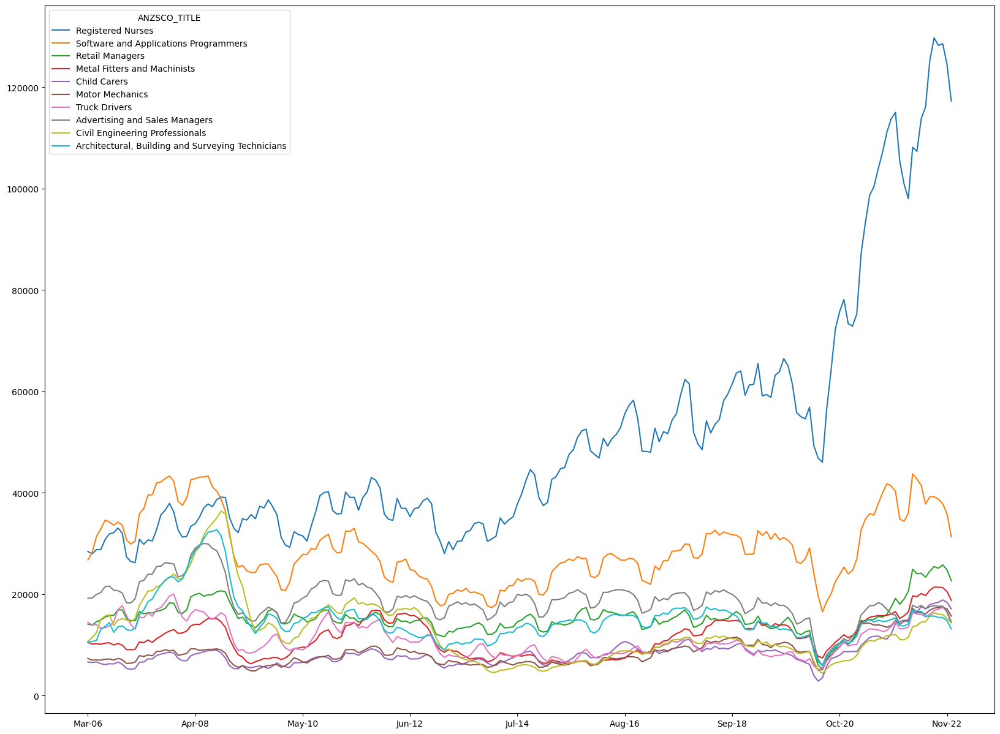

In [27]:
Australia_top= Australia_top.drop(columns=['Unit Group','ANZSCO Code'])

Australia_top = Australia_top.T

Australia_top.plot(legend=True, figsize=(20,15))
plt.show()

# Internet Vacancy Index evolution filtered by current Shortage and future Strong demand

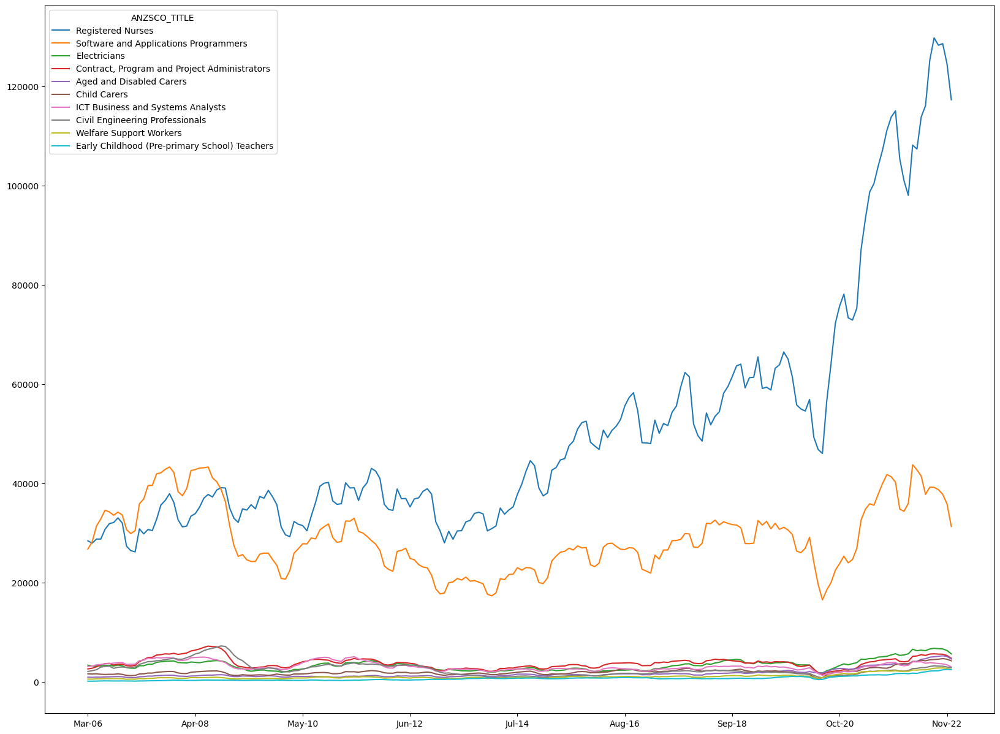

In [28]:
Aus_High_Demand_Top= Aus_High_Demand_Top.drop(columns=['Unit Group','ANZSCO Code'])

Aus_High_Demand_Top = Aus_High_Demand_Top.T

Aus_High_Demand_Top.plot(legend=True, figsize=(20,15))
plt.show()

## Internet Vacancy Evolution per state

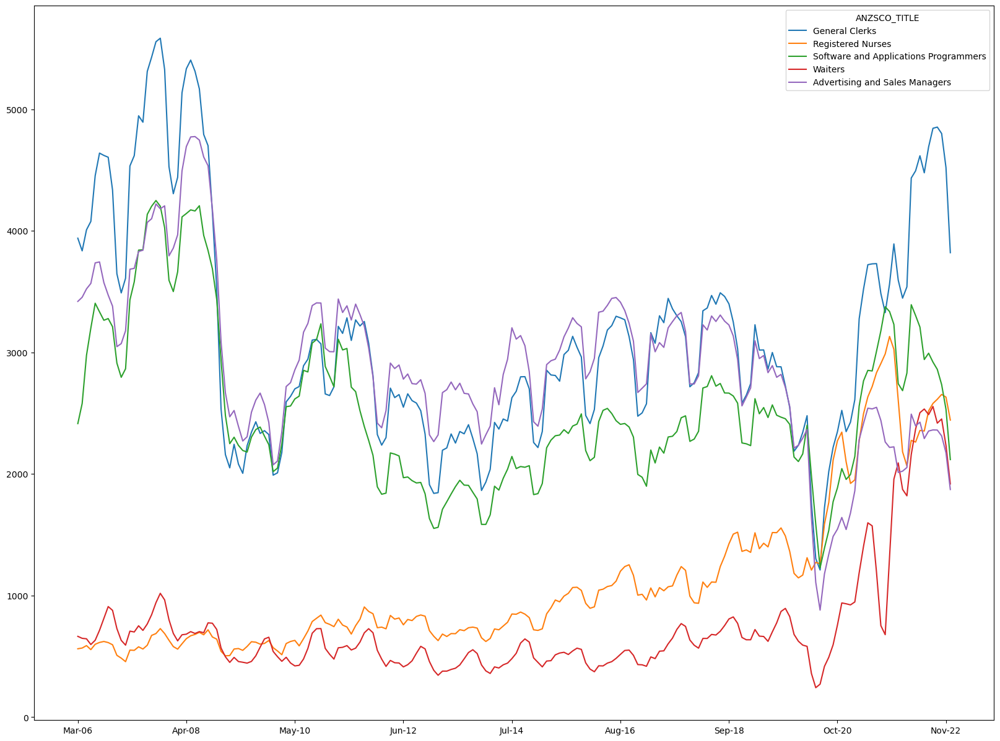

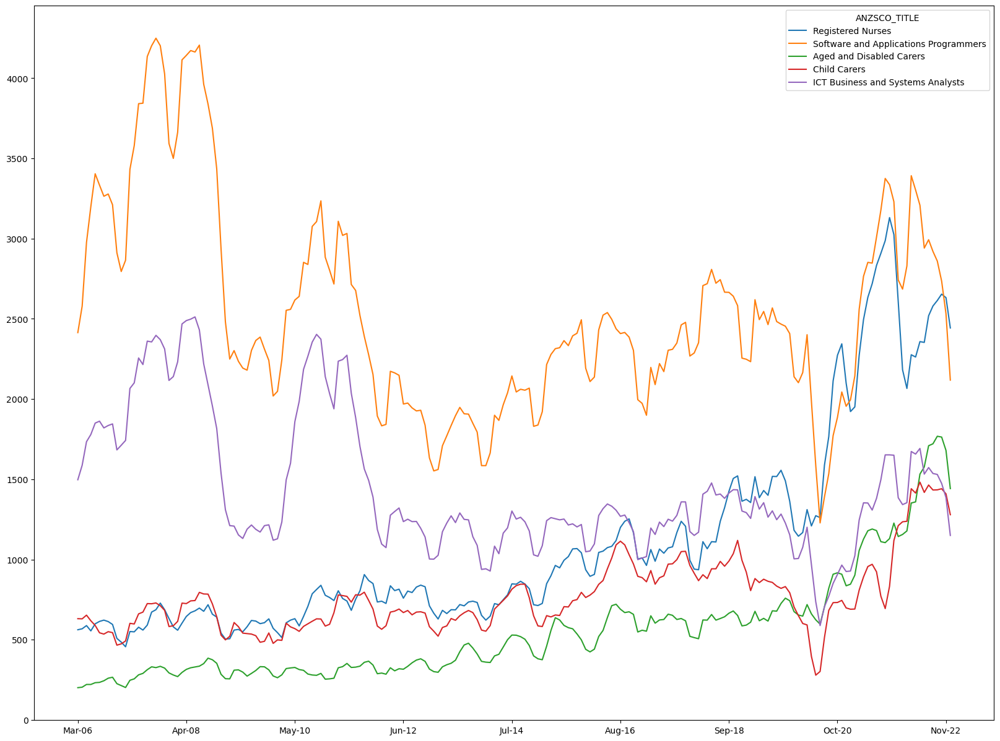

In [29]:
# NSW Data

NSW_data_HD = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong")& (mergedx3_df["NSW"]=="S") & (mergedx3_df["state"]=="NSW"),:]
NSW_data_all = mergedx3_df.loc[ (mergedx3_df["state"]=="NSW"),:]

NSW_all=NSW_data_all.groupby("ANZSCO_TITLE").max()
NSW_top=NSW_data_HD.groupby("ANZSCO_TITLE").max()

NSW_all = NSW_all.sort_values("Dec-22", ascending=False)
NSW_top = NSW_top.sort_values("Dec-22", ascending=False)

NSW_all_top = NSW_all.head(5)
NSW_HD_top = NSW_top.head(5)

NSW_all_top= NSW_all_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])
NSW_HD_top= NSW_HD_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])

NSW_all_top = NSW_all_top.T
NSW_HD_top = NSW_HD_top.T

NSW_all_top.plot(legend=True, figsize=(20,15))
plt.show()

NSW_HD_top.plot(legend=True, figsize=(20,15))
plt.show()

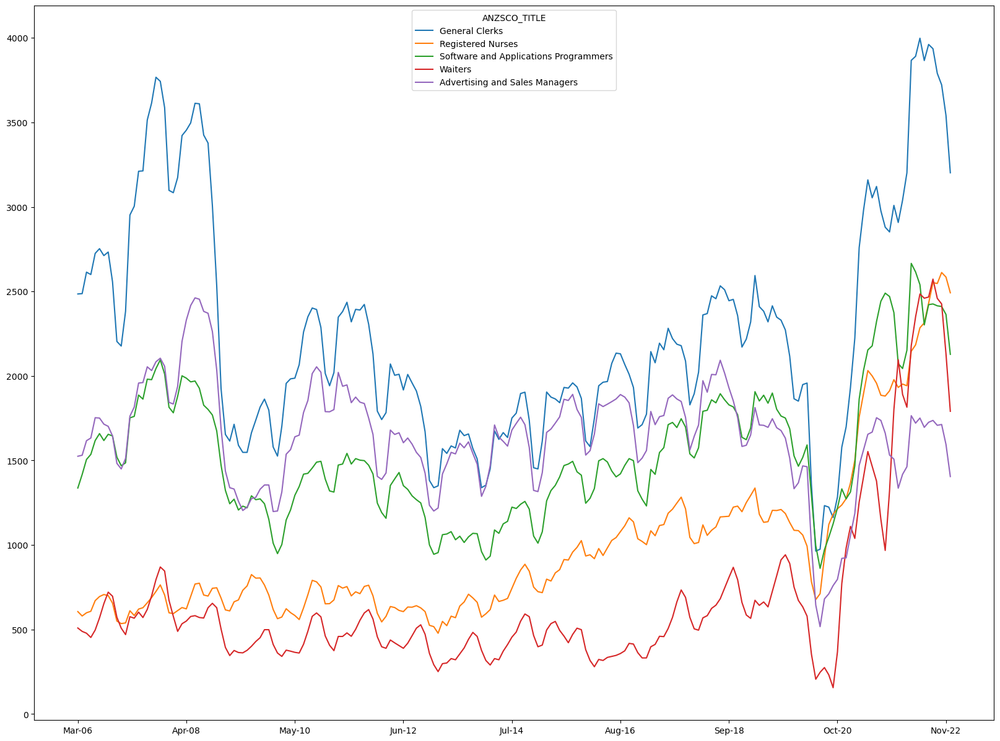

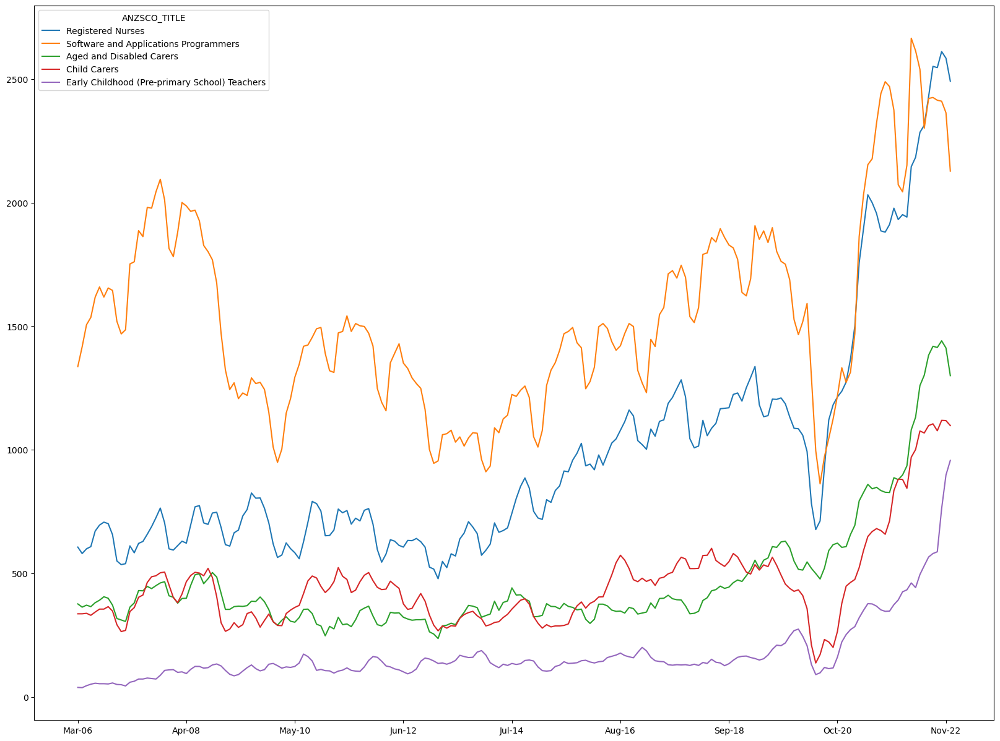

In [30]:

#### VIC Data

VIC_data_HD = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong")& (mergedx3_df["VIC"]=="S") & (mergedx3_df["state"]=="VIC"),:]
VIC_data_all = mergedx3_df.loc[ (mergedx3_df["state"]=="VIC"),:]

VIC_all=VIC_data_all.groupby("ANZSCO_TITLE").max()
VIC_top=VIC_data_HD.groupby("ANZSCO_TITLE").max()

VIC_all = VIC_all.sort_values("Dec-22", ascending=False)
VIC_top = VIC_top.sort_values("Dec-22", ascending=False)

VIC_all_top = VIC_all.head(5)
VIC_HD_top = VIC_top.head(5)

VIC_all_top= VIC_all_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])
VIC_HD_top= VIC_HD_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])

VIC_all_top = VIC_all_top.T
VIC_HD_top = VIC_HD_top.T

VIC_all_top.plot(legend=True, figsize=(20,15))
plt.show()

VIC_HD_top.plot(legend=True, figsize=(20,15))
plt.show()

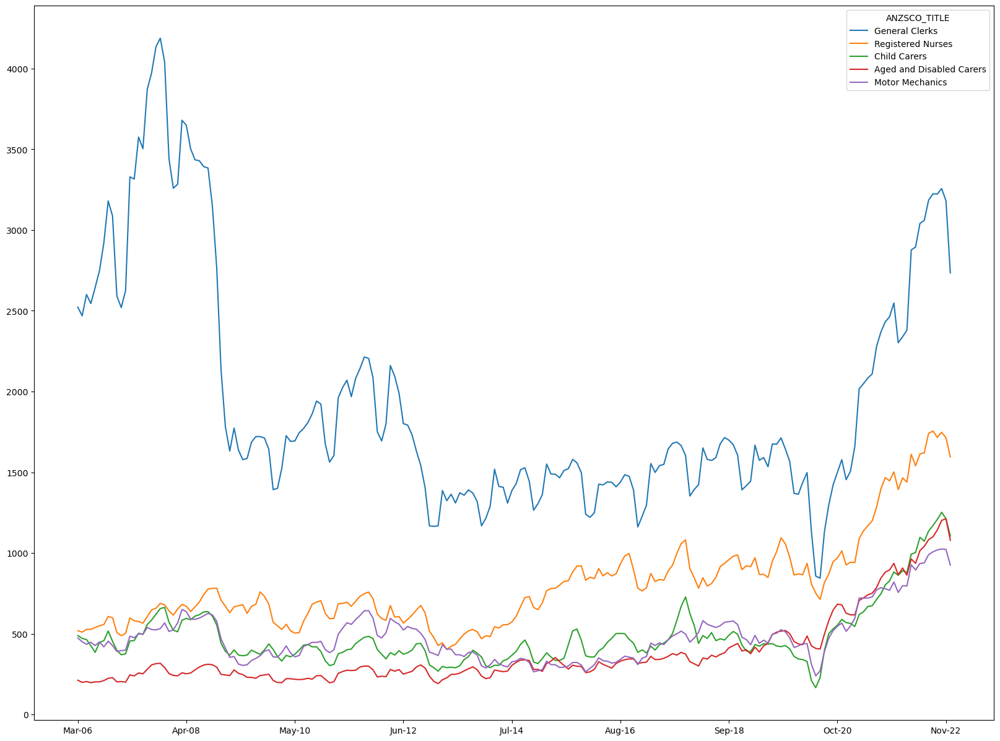

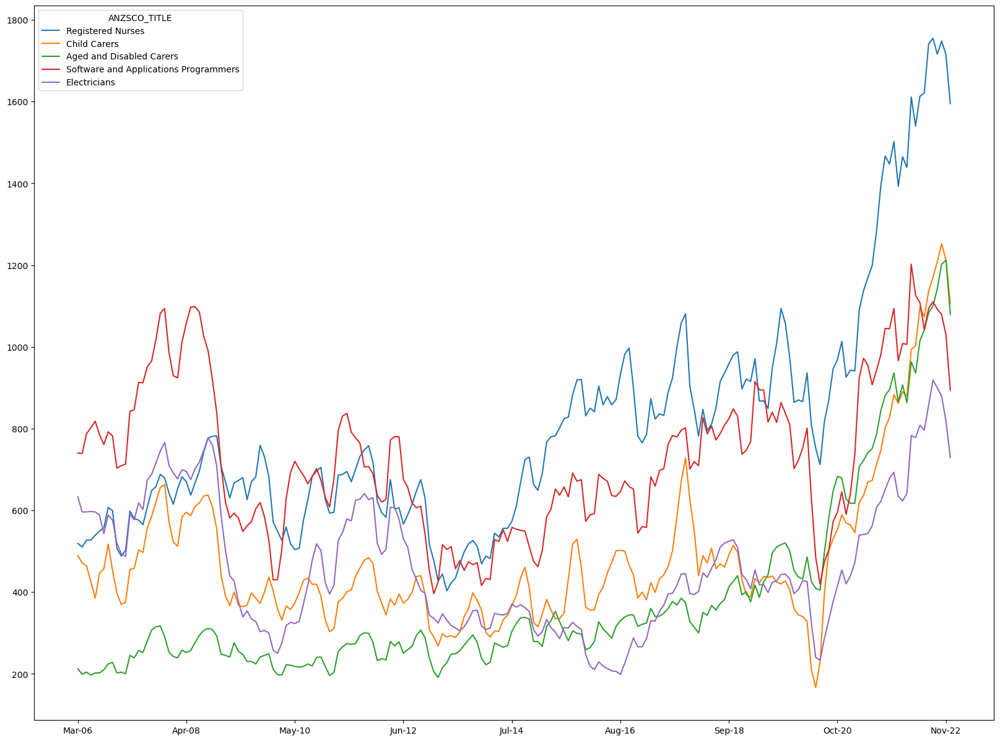

In [31]:
#### QLD Data

QLD_data_HD = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong")& (mergedx3_df["QLD"]=="S") & (mergedx3_df["state"]=="QLD"),:]
QLD_data_all = mergedx3_df.loc[ (mergedx3_df["state"]=="QLD"),:]

QLD_all=QLD_data_all.groupby("ANZSCO_TITLE").max()
QLD_top=QLD_data_HD.groupby("ANZSCO_TITLE").max()

QLD_all = QLD_all.sort_values("Dec-22", ascending=False)
QLD_top = QLD_top.sort_values("Dec-22", ascending=False)

QLD_all_top = QLD_all.head(5)
QLD_HD_top = QLD_top.head(5)

QLD_all_top= QLD_all_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])
QLD_HD_top= QLD_HD_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])

QLD_all_top = QLD_all_top.T
QLD_HD_top = QLD_HD_top.T

QLD_all_top.plot(legend=True, figsize=(20,15))
plt.show()

QLD_HD_top.plot(legend=True, figsize=(20,15))
plt.show()

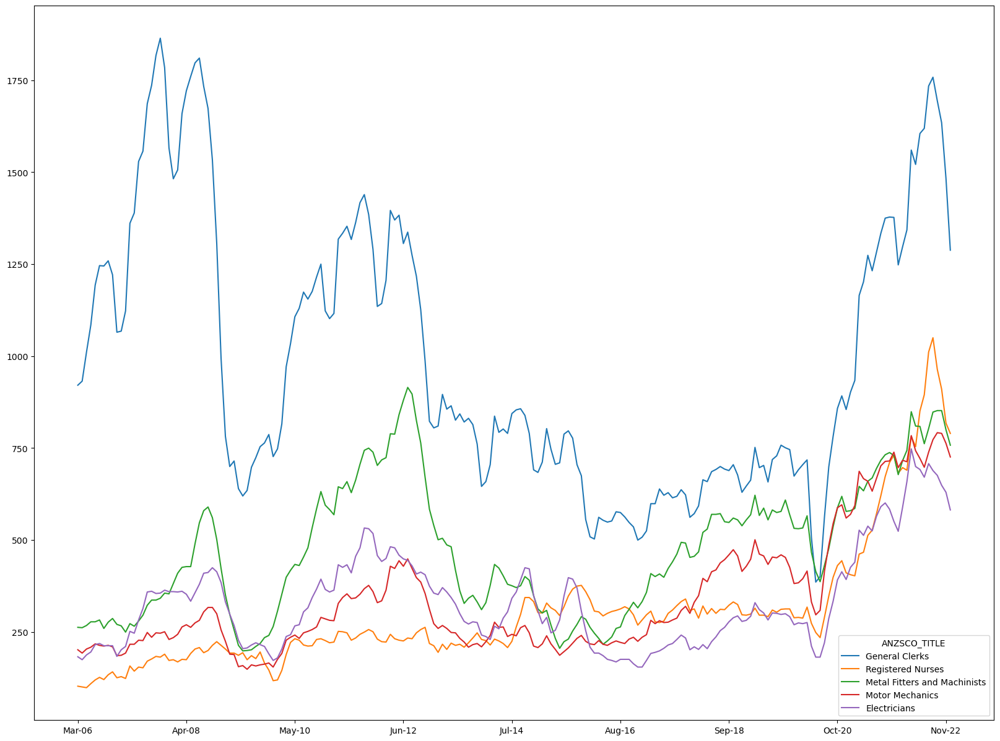

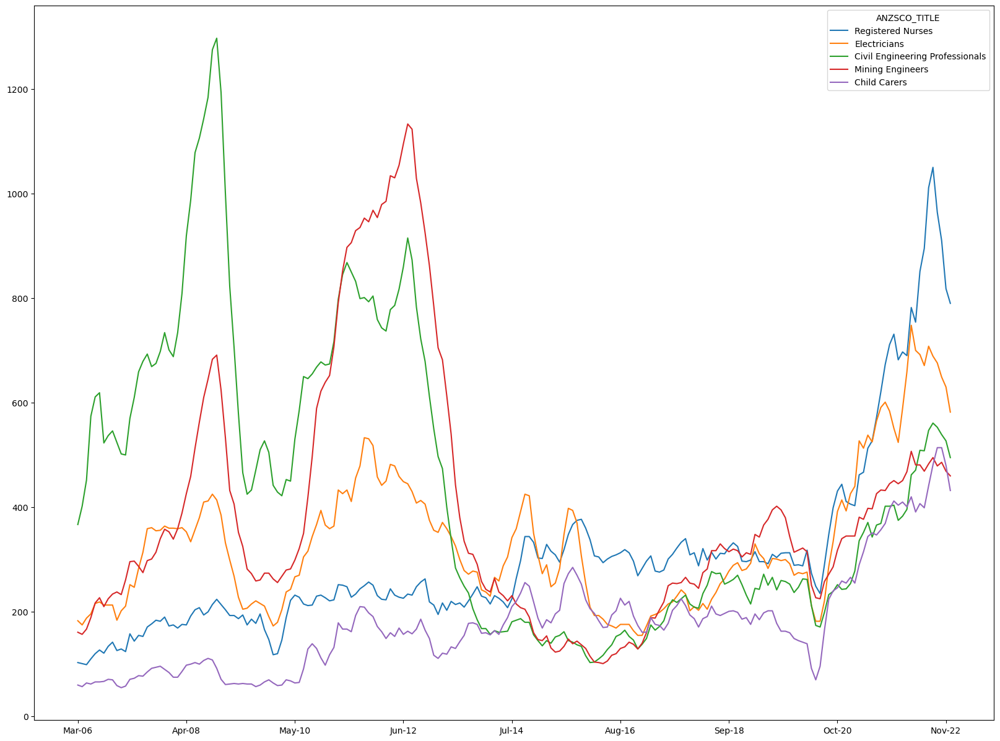

In [32]:
#### WA Data

WA_data_HD = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong")& (mergedx3_df["WA"]=="S") & (mergedx3_df["state"]=="WA"),:]
WA_data_all = mergedx3_df.loc[ (mergedx3_df["state"]=="WA"),:]

WA_all=WA_data_all.groupby("ANZSCO_TITLE").max()
WA_top=WA_data_HD.groupby("ANZSCO_TITLE").max()

WA_all = WA_all.sort_values("Dec-22", ascending=False)
WA_top = WA_top.sort_values("Dec-22", ascending=False)

WA_all_top = WA_all.head(5)
WA_HD_top = WA_top.head(5)

WA_all_top= WA_all_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])
WA_HD_top= WA_HD_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])

WA_all_top = WA_all_top.T
WA_HD_top = WA_HD_top.T

WA_all_top.plot(legend=True, figsize=(20,15))
plt.show()

WA_HD_top.plot(legend=True, figsize=(20,15))
plt.show()

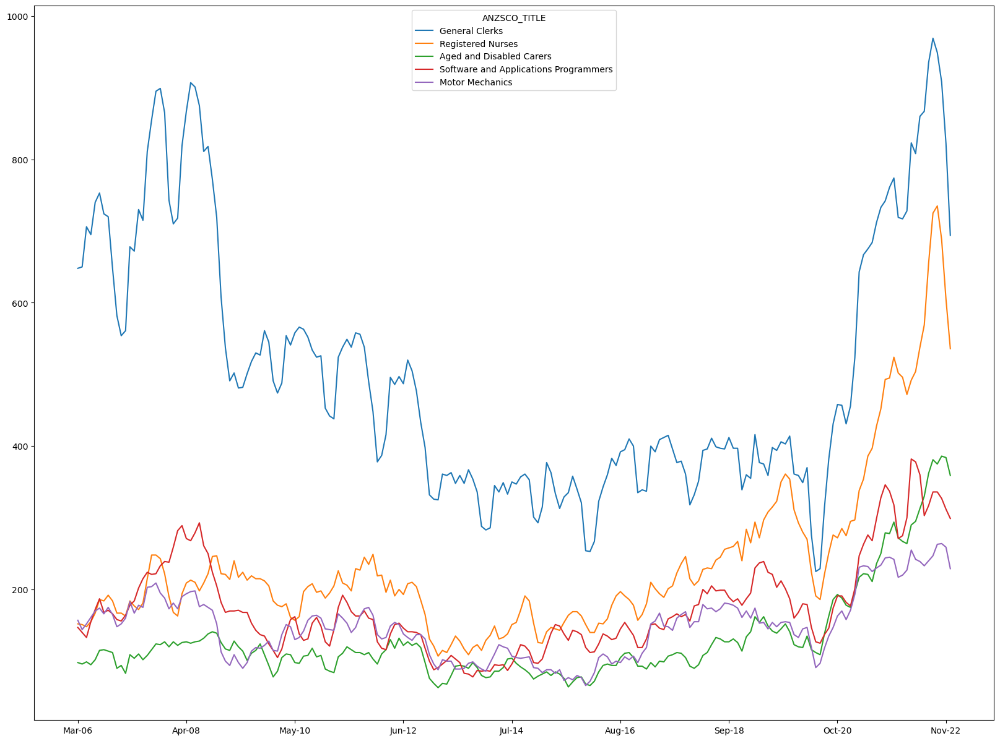

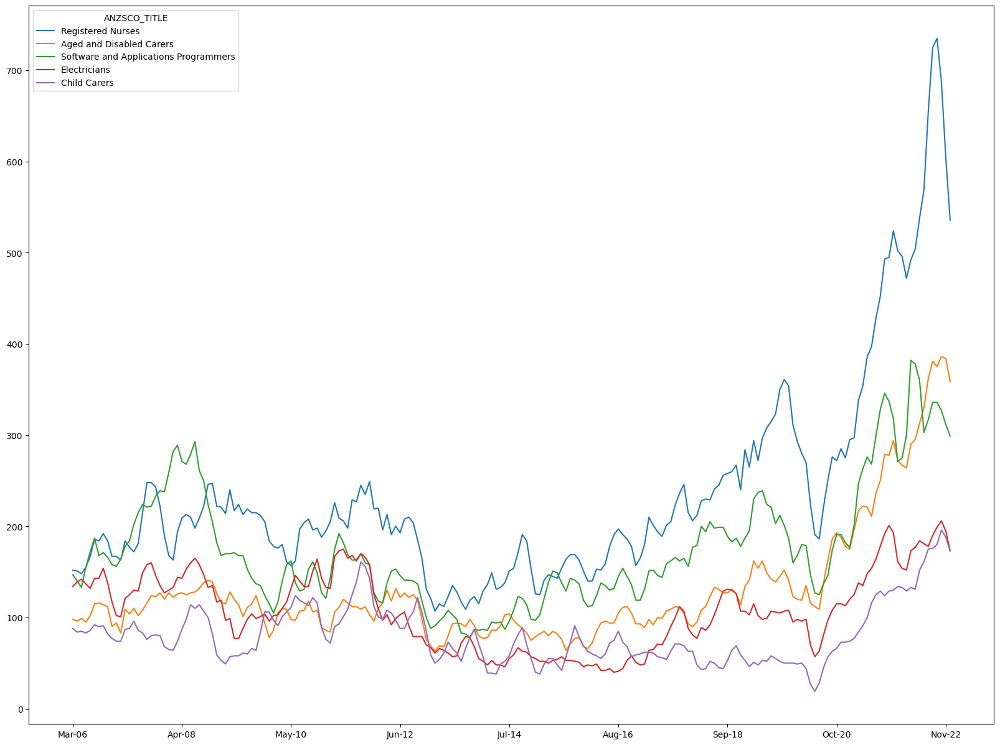

In [33]:
#### SA Data

SA_data_HD = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong")& (mergedx3_df["SA"]=="S") & (mergedx3_df["state"]=="SA"),:]
SA_data_all = mergedx3_df.loc[ (mergedx3_df["state"]=="SA"),:]

SA_all=SA_data_all.groupby("ANZSCO_TITLE").max()
SA_top=SA_data_HD.groupby("ANZSCO_TITLE").max()

SA_all = SA_all.sort_values("Dec-22", ascending=False)
SA_top = SA_top.sort_values("Dec-22", ascending=False)

SA_all_top = SA_all.head(5)
SA_HD_top = SA_top.head(5)

SA_all_top= SA_all_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])
SA_HD_top= SA_HD_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])

SA_all_top = SA_all_top.T
SA_HD_top = SA_HD_top.T

SA_all_top.plot(legend=True, figsize=(20,15))
plt.show()

SA_HD_top.plot(legend=True, figsize=(20,15))
plt.show()

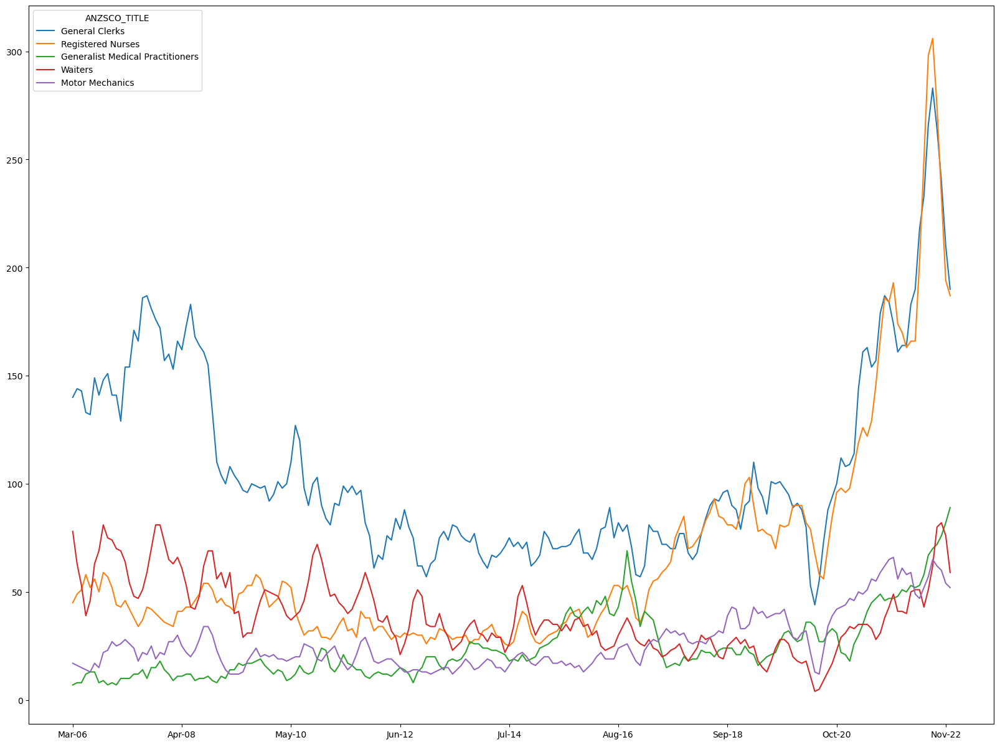

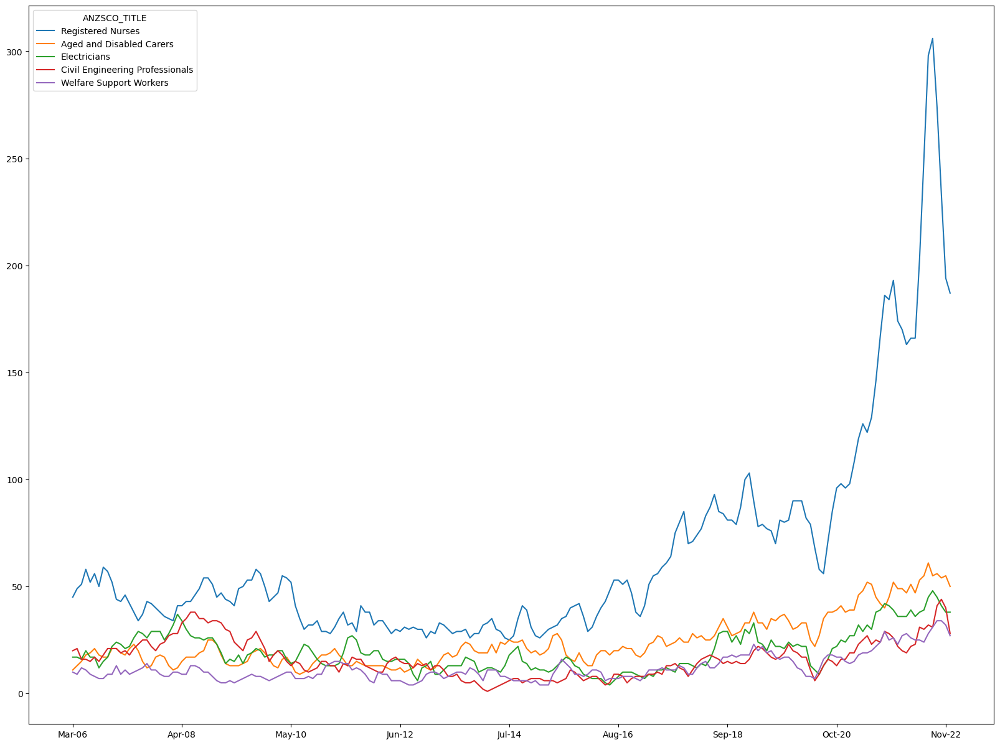

In [34]:
#### TAS Data

TAS_data_HD = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong")& (mergedx3_df["TAS"]=="S") & (mergedx3_df["state"]=="TAS"),:]
TAS_data_all = mergedx3_df.loc[ (mergedx3_df["state"]=="TAS"),:]

TAS_all=TAS_data_all.groupby("ANZSCO_TITLE").max()
TAS_top=TAS_data_HD.groupby("ANZSCO_TITLE").max()

TAS_all = TAS_all.sort_values("Dec-22", ascending=False)
TAS_top = TAS_top.sort_values("Dec-22", ascending=False)

TAS_all_top = TAS_all.head(5)
TAS_HD_top = TAS_top.head(5)

TAS_all_top= TAS_all_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])
TAS_HD_top= TAS_HD_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])

TAS_all_top = TAS_all_top.T
TAS_HD_top = TAS_HD_top.T

TAS_all_top.plot(legend=True, figsize=(20,15))
plt.show()

TAS_HD_top.plot(legend=True, figsize=(20,15))
plt.show()

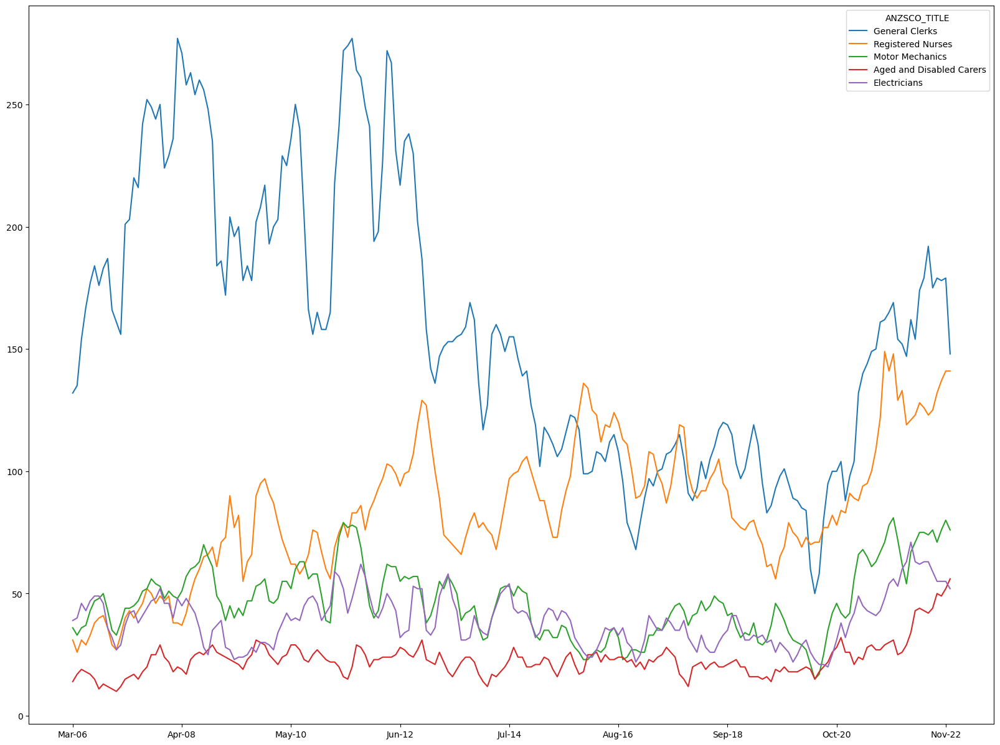

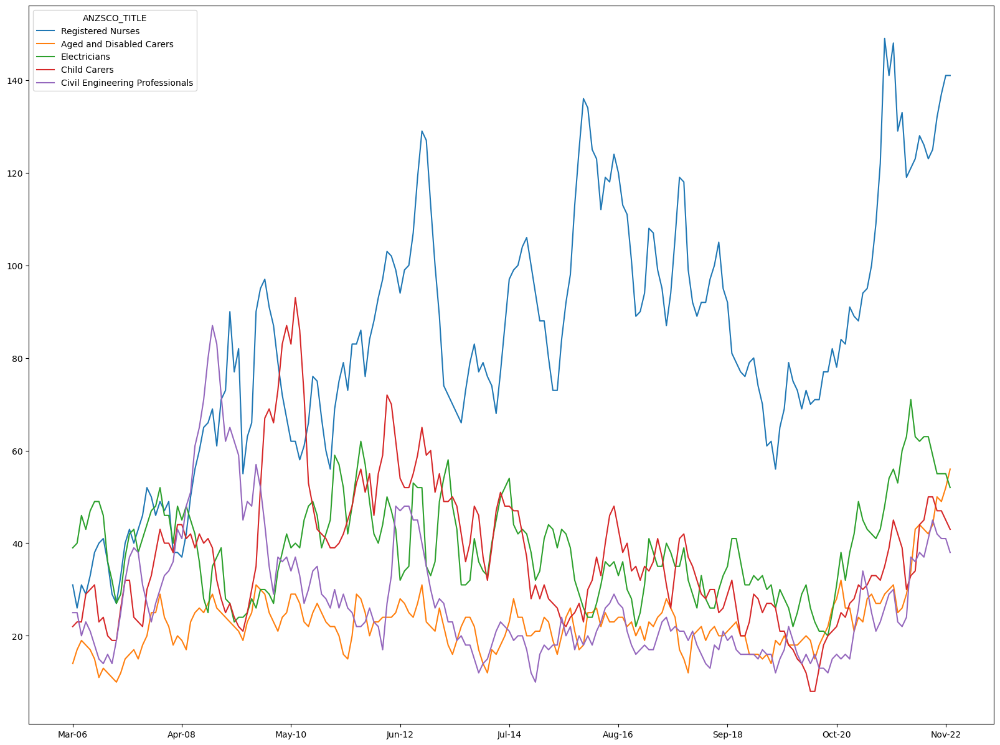

In [35]:
#### NT Data

NT_data_HD = mergedx3_df.loc[(mergedx3_df["Current National Labour Market Rating"]=="S") & (mergedx3_df["National Future Demand Rating"]=="Strong")& (mergedx3_df["NT"]=="S") & (mergedx3_df["state"]=="NT"),:]
NT_data_all = mergedx3_df.loc[ (mergedx3_df["state"]=="NT"),:]

NT_all=NT_data_all.groupby("ANZSCO_TITLE").max()
NT_top=NT_data_HD.groupby("ANZSCO_TITLE").max()

NT_all = NT_all.sort_values("Dec-22", ascending=False)
NT_top = NT_top.sort_values("Dec-22", ascending=False)

NT_all_top = NT_all.head(5)
NT_HD_top = NT_top.head(5)

NT_all_top= NT_all_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])
NT_HD_top= NT_HD_top.drop(columns=['Unit Group','state','ANZSCO Code','Occupation title', 'Current National Labour Market Rating', 'National Future Demand Rating','NSW','VIC','QLD','SA','WA','TAS','NT','ACT'])

NT_all_top = NT_all_top.T
NT_HD_top = NT_HD_top.T

NT_all_top.plot(legend=True, figsize=(20,15))
plt.show()

NT_HD_top.plot(legend=True, figsize=(20,15))
plt.show()

# Evaluating future demand based on Internet Vacancy Index

To evaluate the future demand a Linear regression was perfomed on the IVI time series for each of the
most relevant occupations (Currently in Shortage and with strong Future demand)
The start of the series was chosen as Jul-2020 where all the IVI indexes start presenting an increasing tendency.
The IVI plot has been presented below again for visualisation of the point above: note that IVI for the different occupations reaches a minimum point in 2020 and starts increasing from Jul-2020

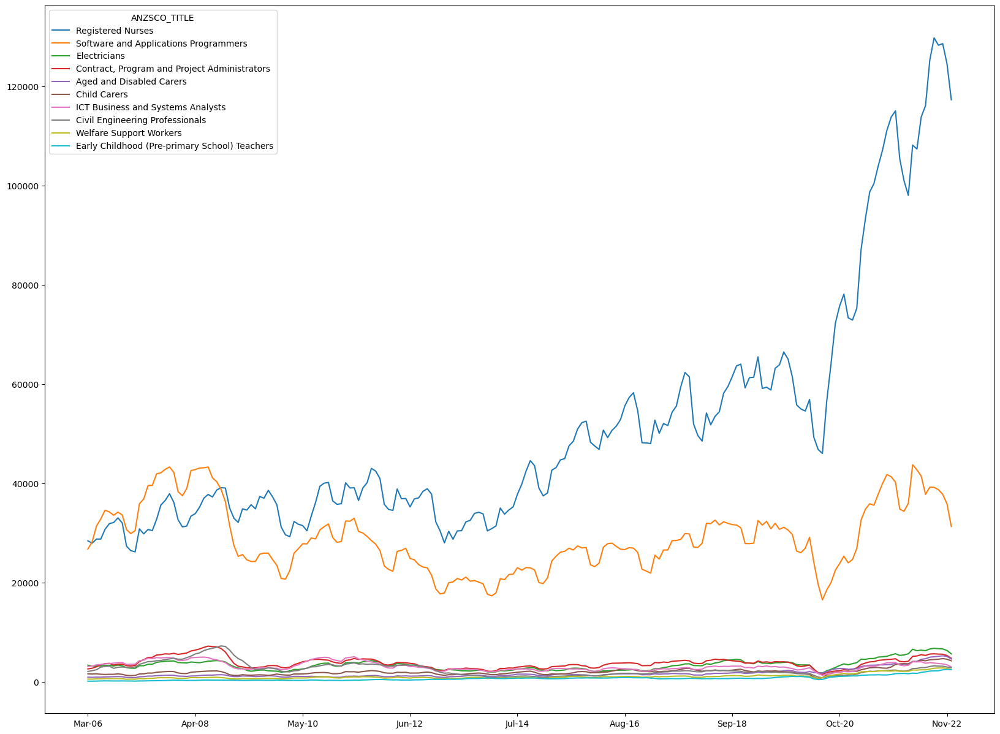

In [38]:
Aus_High_Demand_Top.plot(legend=True, figsize=(20,15))
plt.show()

A linear function was created to perform the analysis

In [36]:
# Define a function to create Linear Regression plots
def linear_regresion (x_values,y_values, xlabel, ylabel):

    # Perform a linear regression on temperature vs. latitude
    
    (slope, intercept, rvalue, pvalue, stderr) = stats.linregress(x_values, y_values)
    
    # Get regression values
    regress_values = x_values * slope + intercept

    # Create line equation string
    line_eq = "y = " + str(round(slope,2)) + "x +" + str(round(intercept,2))

    # Estimations
    x_estimated_0 = len(y_values)
    y_estimated_0 = slope* x_estimated_0 + intercept

    #One year
    x_estimated_1 = x_estimated_0+12
    y_estimated_1 = slope* x_estimated_1 + intercept

    #five years
    x_estimated_2 = x_estimated_0 + 5*12
    y_estimated_2 = slope* x_estimated_2 + intercept

    # x_est = [x_estimated_0, x_estimated_1, x_estimated_2 ]
    # y_est = [y_estimated_0, y_estimated_1, y_estimated_2 ]
    x_est = [x_estimated_0, x_estimated_1 ]
    y_est = [y_estimated_0, y_estimated_1 ]


    x_to_double = (2*y_estimated_0-intercept)/slope
    x_to_double_y = x_to_double/12


    # Create Plot
    # 
    plt.scatter(x_est,y_est)
    plt.scatter(x_values,y_values)
    plt.plot(x_values,regress_values,"r-")
    
    
    # Label plot and annotate the line equation
    # 
    plt.xlabel(f'{xlabel}')
    plt.ylabel(f'{ylabel}')
    plt.annotate(line_eq,(x_values.mean(),y_values.max()-0.2*y_values.mean()),fontsize=15,color="red")
    
    # Print r value
    print(f"The r-value is: {rvalue**2}")
    print(f"{round(x_to_double,1)} Months required to double the demand")
    print(f"{round(x_to_double_y,1)} Years required to double the demand. {ylabel} demand will be {round(2*y_estimated_0,0)}")

In [37]:
Aus_High_Demand_Top

ANZSCO_TITLE,Registered Nurses,Software and Applications Programmers,Electricians,"Contract, Program and Project Administrators",Aged and Disabled Carers,Child Carers,ICT Business and Systems Analysts,Civil Engineering Professionals,Welfare Support Workers,Early Childhood (Pre-primary School) Teachers
Mar-06,28448,26785,3408,2646,984,1657,3124,2136,600,179
Apr-06,27972,28260,3224,2786,957,1632,3232,2291,580,182
May-06,28798,31415,3254,3068,995,1658,3467,2482,648,208
Jun-06,28798,32850,3256,3486,984,1577,3513,3010,644,221
Jul-06,30772,34615,3340,3710,1031,1532,3675,3137,684,241
...,...,...,...,...,...,...,...,...,...,...
Aug-22,129738,39210,6794,5686,5101,4549,3831,3269,2782,2253
Sep-22,128254,38745,6726,5634,5179,4603,3737,3214,2838,2270
Oct-22,128576,37810,6666,5602,5283,4721,3650,3199,2852,2470
Nov-22,124516,35875,6360,5352,5162,4600,3481,3041,2756,2542


## Registered Nurses projection

The r-value is: 0.8610881233271541
90.2 Months required to double the demand
7.5 Years required to double the demand. Registered Nurses demand will be 263690.0


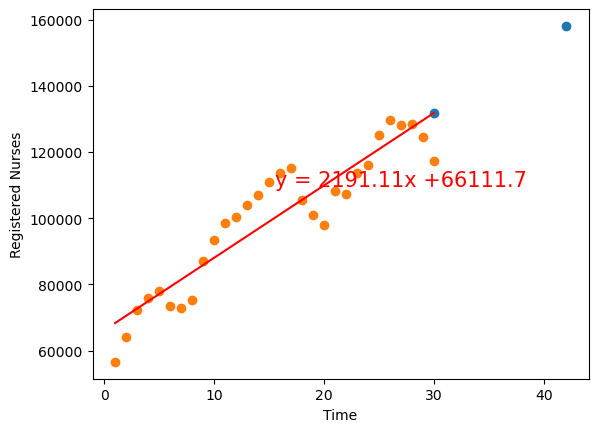

In [39]:
y = Aus_High_Demand_Top["Registered Nurses"].iloc[172:202]
x_axis = np.arange(1, len(y)+1, 1)
linear_regresion (x_axis,y, "Time", "Registered Nurses")

## Software and Applications Programmers projection

The r-value is: 0.5460432291435708
100.0 Months required to double the demand
8.3 Years required to double the demand. Software and Applications Programmers demand will be 85720.0


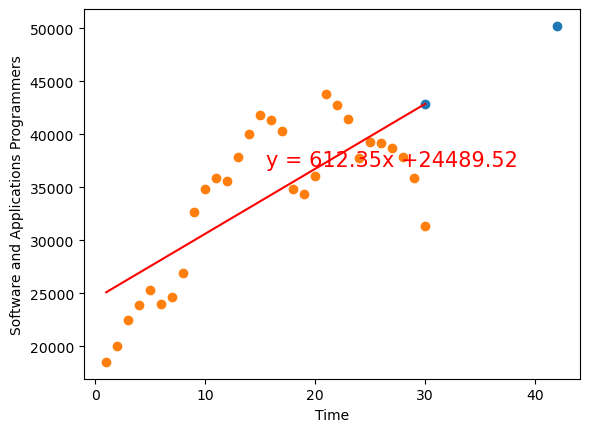

In [40]:
y = Aus_High_Demand_Top["Software and Applications Programmers"].iloc[172:202]
x_axis = np.arange(1, len(y)+1, 1)
linear_regresion (x_axis,y, "Time", "Software and Applications Programmers")

## Electricians projection

The r-value is: 0.8941863541759522
79.9 Months required to double the demand
6.7 Years required to double the demand. Electricians demand will be 14294.0


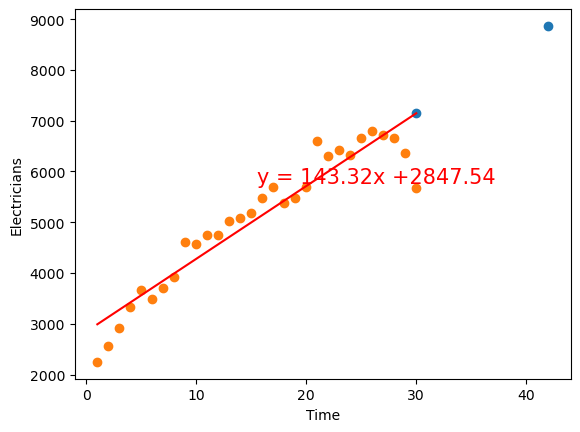

In [41]:
y = Aus_High_Demand_Top["Electricians"].iloc[172:202]
x_axis = np.arange(1, len(y)+1, 1)
linear_regresion (x_axis,y, "Time", "Electricians")

## Contract, Program and Project Administrators projection

The r-value is: 0.870453021057228
76.1 Months required to double the demand
6.3 Years required to double the demand. Contract, Program and Project Administrators Demand demand will be 12011.0


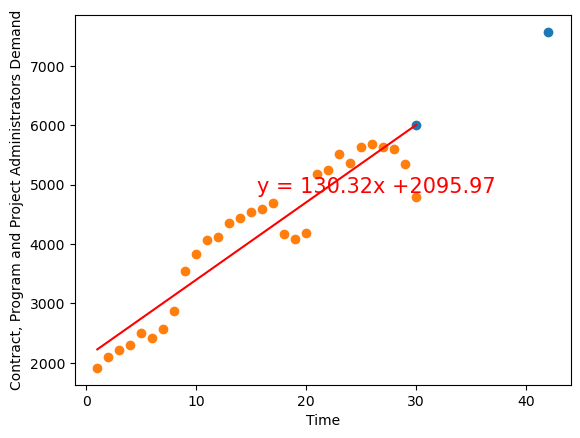

In [42]:
y = Aus_High_Demand_Top["Contract, Program and Project Administrators"].iloc[172:202]
x_axis = np.arange(1, len(y)+1, 1)
linear_regresion (x_axis,y, "Time", "Contract, Program and Project Administrators Demand")

## Aged and Disabled Carers projection

The r-value is: 0.929867675405898
80.6 Months required to double the demand
6.7 Years required to double the demand. Aged and Disabled Carers Demand demand will be 10302.0


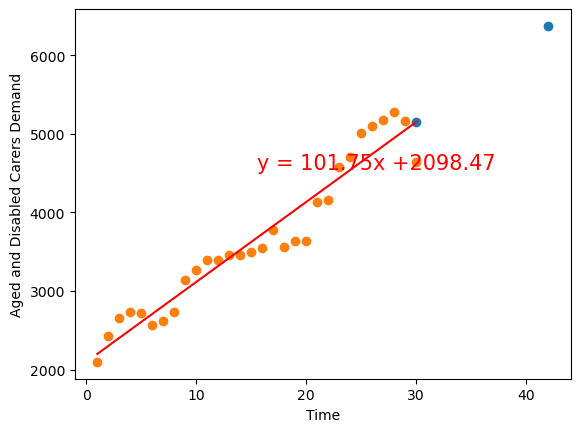

In [43]:
y = Aus_High_Demand_Top["Aged and Disabled Carers"].iloc[172:202]
x_axis = np.arange(1, len(y)+1, 1)
linear_regresion (x_axis,y, "Time", "Aged and Disabled Carers Demand")

## Child Carers projection

The r-value is: 0.9624984241675042
73.2 Months required to double the demand
6.1 Years required to double the demand. Child Carers demand will be 9743.0


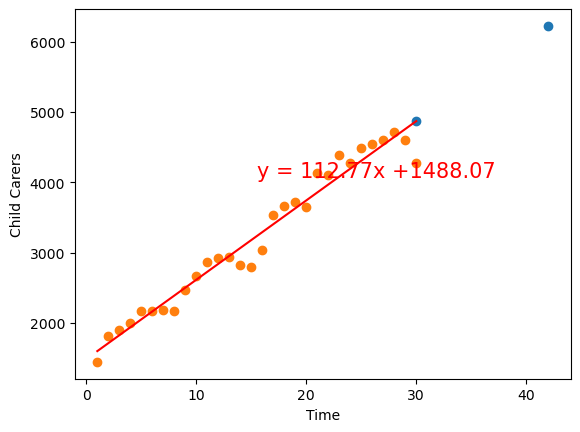

In [44]:
y = Aus_High_Demand_Top["Child Carers"].iloc[172:202]
x_axis = np.arange(1, len(y)+1, 1)
linear_regresion (x_axis,y, "Time", "Child Carers")

## ICT Business and Systems Analysts projection

The r-value is: 0.6524633984180458
88.1 Months required to double the demand
7.3 Years required to double the demand. ICT Business and Systems Analysts demand will be 8431.0


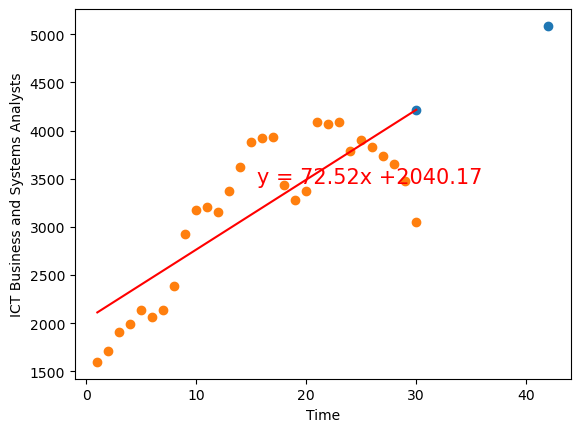

In [45]:
y = Aus_High_Demand_Top["ICT Business and Systems Analysts"].iloc[172:202]
x_axis = np.arange(1, len(y)+1, 1)
linear_regresion (x_axis,y, "Time", "ICT Business and Systems Analysts")